## GLOBAL OCEAN WIND L4 REPROCESSED MONTHLY MEAN OBSERVATIONS
For the Global Ocean - The climatology refers to time series of monthly averaged wind variables calculated over the global oceans. It is estimated from daily global wind fields calculated from retrievals derived from ASCAT scatterometers onboard METOP-A and METOP-B satellites. It consists of six variables including monthly averaged wind speed, zonal and meridional wind components, wind stress amplitude and the associated components. They are calculated as arithmetic means of ASCAT daily wind analyses. The gridded daily wind and wind stress fields have been estimated over global oceans from Metop/ASCAT retrievals using the objective method. The daily analyses use standard products ASCAT L2b during the period April 2007 to present. Wind stress and the related components are estimated over swaths based on the use of Coare3.0 parameterization. The resulting daily fields are estimated as equivalent neutral-stability 10-m winds, and have spatial resolutions of 0.25° in longitude and latitude over global ocean. The objective method provides also errors characterizing the quality of each daily wind parameters at grid cell. More details about the data, the objective method, and computation algorithm may be found in (Bentamy et al, 2011. For monthly calculation purposes, only valid daily data available within each month of the period are used. The monthly winds are estimated at each grid point (0.25°x0.25°) from at least 25 daily values available at the same grid point. The associated root mean square (rms) values are also calculated at each grid point and used as quality control parameter.

Coordinate system: WGS 84 (EPSG 4326)

Temporal Coverage: from 2007-05-16T00:00:00Z to 2019-12-31T00:00:00Z

In [11]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# for autocompletion on pandas dataframes disable the autocompletion tool 'jedi'
%config Completer.use_jedi = False

# formatter
%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
wind = xr.open_dataset(
    "/home/imke/Desktop/MariData/Data/CMEMS/CERSAT-GLO-REP_WIND_L4-OBS_FULL_TIME_SERIE_1611580867098.nc"
)

In [134]:
# Let's have alook at the wind data set.
# As time has only one value, this is not a time series but rather a single image
wind

<xarray.Dataset>
Dimensions:                                (depth: 1, latitude: 641, longitude: 1440, time: 1)
Coordinates:
  * time                                   (time) datetime64[ns] 2019-12-01T1...
  * depth                                  (depth) float32 10.0
  * latitude                               (latitude) float32 -79.88 ... 80.12
  * longitude                              (longitude) float32 -179.9 ... 179.9
Data variables:
    surface_downward_eastward_stress       (time, depth, latitude, longitude) float32 ...
    wind_stress_rms                        (time, depth, latitude, longitude) float32 ...
    land_ice_mask                          (time, depth, latitude, longitude) float32 ...
    northward_wind                         (time, depth, latitude, longitude) float32 ...
    sampling_length                        (time, depth, latitude, longitude) float32 ...
    eastward_wind_std                      (time, depth, latitude, longitude) float32 ...
    wind_speed_rms                         (time, depth, latitude, longitude) float32 ...
    northward_wind_rms                     (time, depth, latitude, longitude) float32 ...
    eastward_wind                          (time, depth, latitude, longitude) float32 ...
    surface_downward_northward_stress_std  (time, depth, latitude, longitude) float32 ...
    wind_stress_std                        (time, depth, latitude, longitude) float32 ...
    surface_downward_northward_stress_rms  (time, depth, latitude, longitude) float32 ...
    surface_downward_eastward_stress_std   (time, depth, latitude, longitude) float32 ...
    wind_speed_std                         (time, depth, latitude, longitude) float32 ...
    northward_wind_std                     (time, depth, latitude, longitude) float32 ...
    wind_speed                             (time, depth, latitude, longitude) float32 ...
    wind_stress                            (time, depth, latitude, longitude) float32 ...
    eastward_wind_rms                      (time, depth, latitude, longitude) float32 ...
    surface_downward_northward_stress      (time, depth, latitude, longitude) float32 ...
    surface_downward_eastward_stress_rms   (time, depth, latitude, longitude) float32 ...
Attributes:
    Conventions:              CF-1.4
    title:                    Global Wind, L4 2007-2012 Climatology, 100km mo...
    references:               Bentamy A..and  D. Croize-Fillon, 2011: Gridded...
    institution:              ifremer
    source:                   produced at 2020-01-11
    bulletin_date:            2020-01-11
    contact:                  fpaf@ifremer.fr, Abderrahim.Bentamy@ifremer.fr,...
    creation_date:            2020-01-11
    start_time:               12:00:00
    stop_time:                12:00:00
    start_date:               2019-12-01
    stop_date:                2019-12-01
    northernmost_latitude:    80.125
    southernmost_latitude:    -79.875
    easternmost_longitude:    179.875
    westernmost_longitude:    -179.875
    grid_resolution:          0.250 degree
    file_quality_index:       0.0
    time_resolution:          monthly
    objective_method:         arithmetic mean
    polar_sea_ice_mask_date:  2019-12-01
    creation_date_time:       20200111T103954
    History:                  Translated to CF-1.0 Conventions by Netcdf-Java...
    geospatial_lat_min:       -79.875
    geospatial_lat_max:       80.125
    geospatial_lon_min:       -179.875
    geospatial_lon_max:       179.875

<IPython.core.display.Javascript object>

In the overview above we can see that there are two main types, wind speed and wind stress. Wind speed and wind stess 

# Wind Speed
Wind speed, or wind flow speed, is a fundamental atmospheric quantity caused by air moving from high to low pressure, usually due to changes in temperature. Note that wind direction is usually almost parallel to isobars (and not perpendicular, as one might expect), due to Earth's rotation.

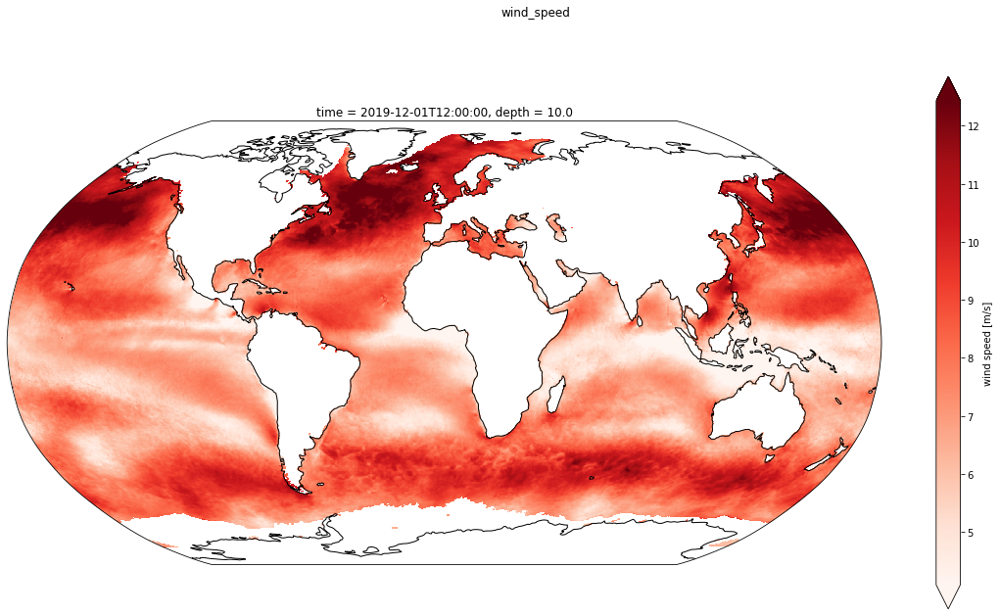

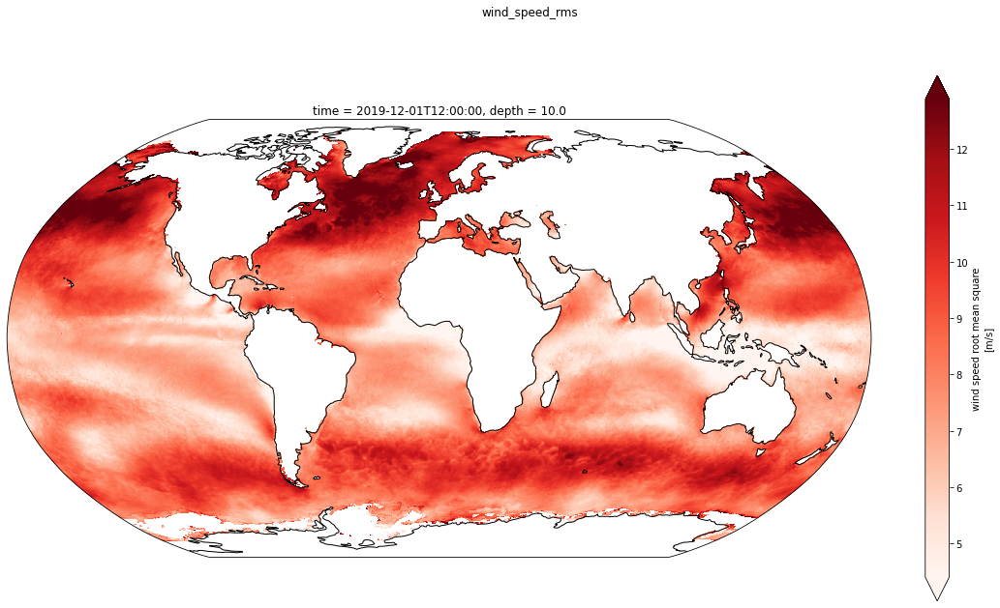

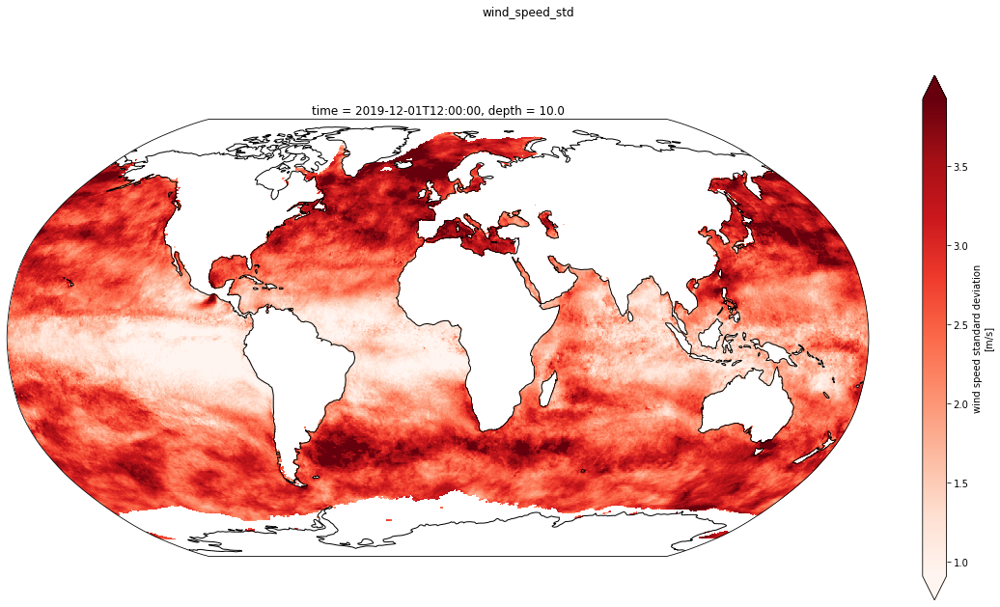

<IPython.core.display.Javascript object>

In [215]:
ls_wind_speed = [wind.wind_speed, wind.wind_speed_rms, wind.wind_speed_std]

for v in ls_wind_speed:
    fig = plt.figure(figsize=(20, 10))
    fig.suptitle("{variable}".format(variable=v.name))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.coastlines()
    p = v.isel(time=0).plot(transform=ccrs.PlateCarree(), robust=True, cmap="Reds")

## Northward wind speed
Northward wind speed holds positive as well as negative values. Negative values correspond to southward wind speeds.Therefore, in the image, red refers to positive and therefore northward wind speeds, while blue refers to negative and southward wind speeds.

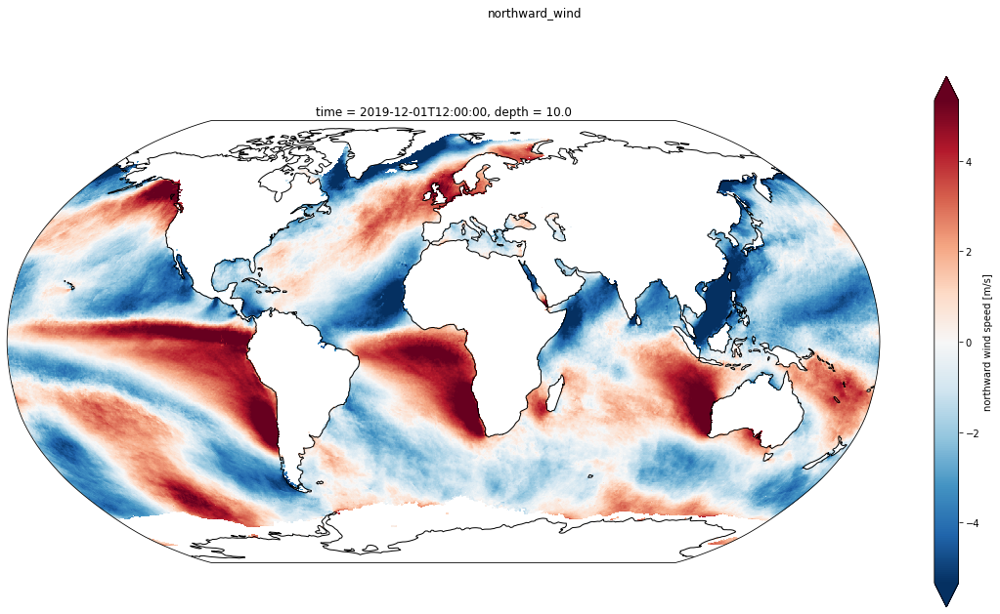

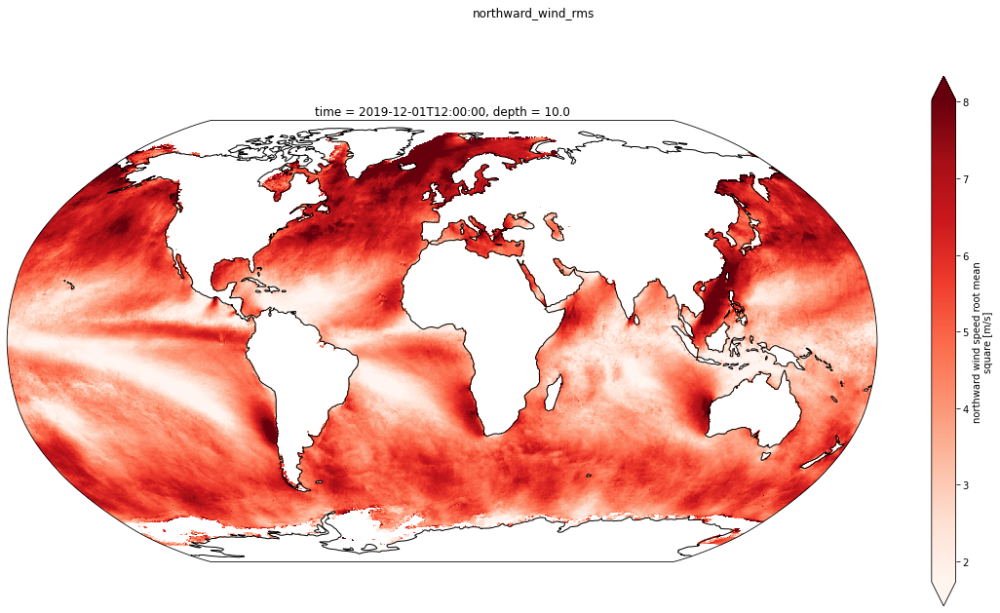

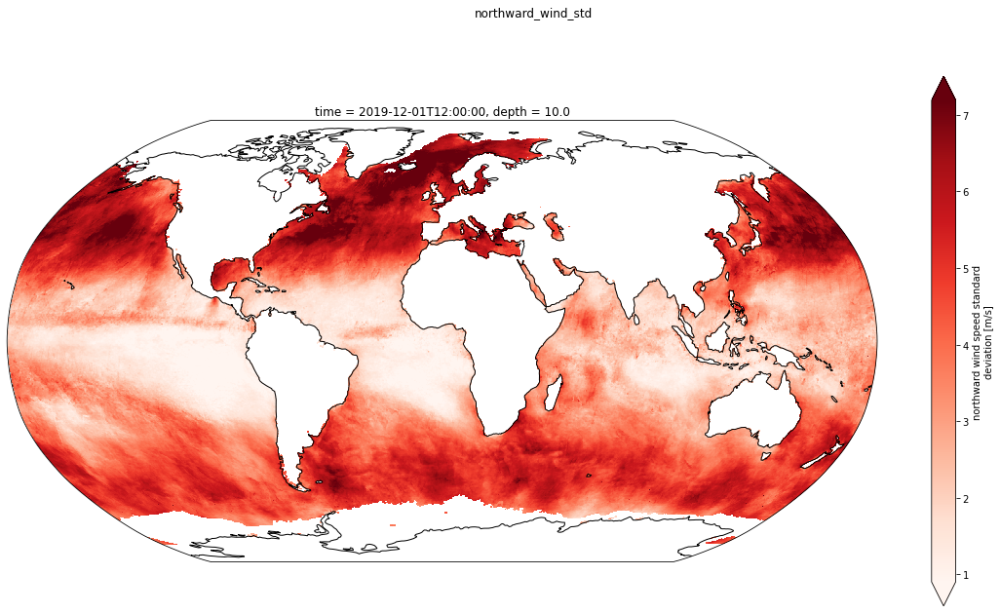

<IPython.core.display.Javascript object>

In [224]:
ls_northward_wind = [
    wind.northward_wind,
    wind.northward_wind_rms,
    wind.northward_wind_std,
]

for v in ls_northward_wind:
    fig = plt.figure(figsize=(20, 10))
    fig.suptitle("{variable}".format(variable=v.name))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.coastlines()
    if v.name == "northward_wind":
        p = v.isel(time=0).plot(
            transform=ccrs.PlateCarree(), robust=True, cmap="RdBu_r"
        )
    else:
        p = v.isel(time=0).plot(transform=ccrs.PlateCarree(), robust=True, cmap="Reds")

## Eastward wind speed

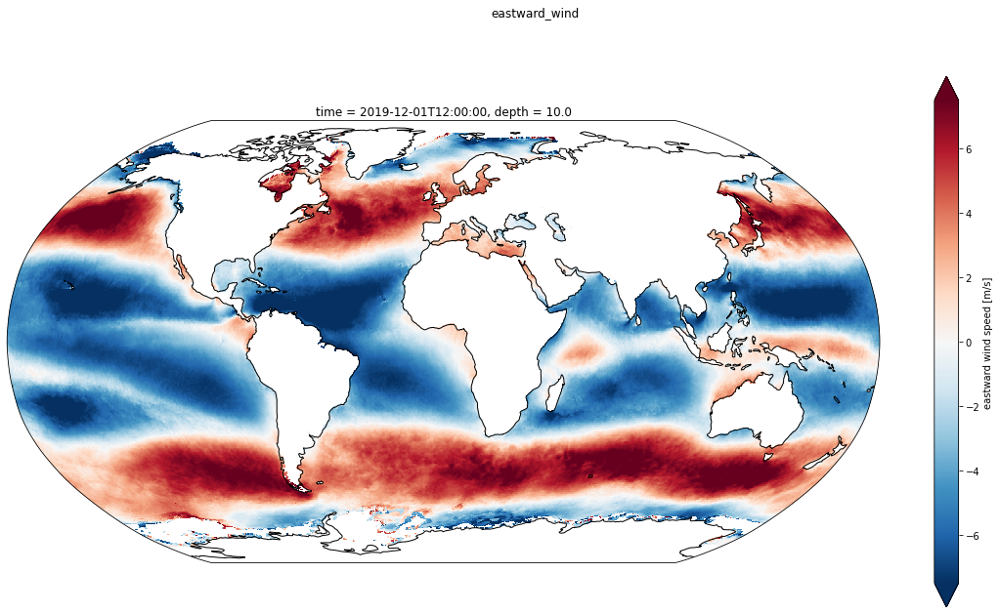

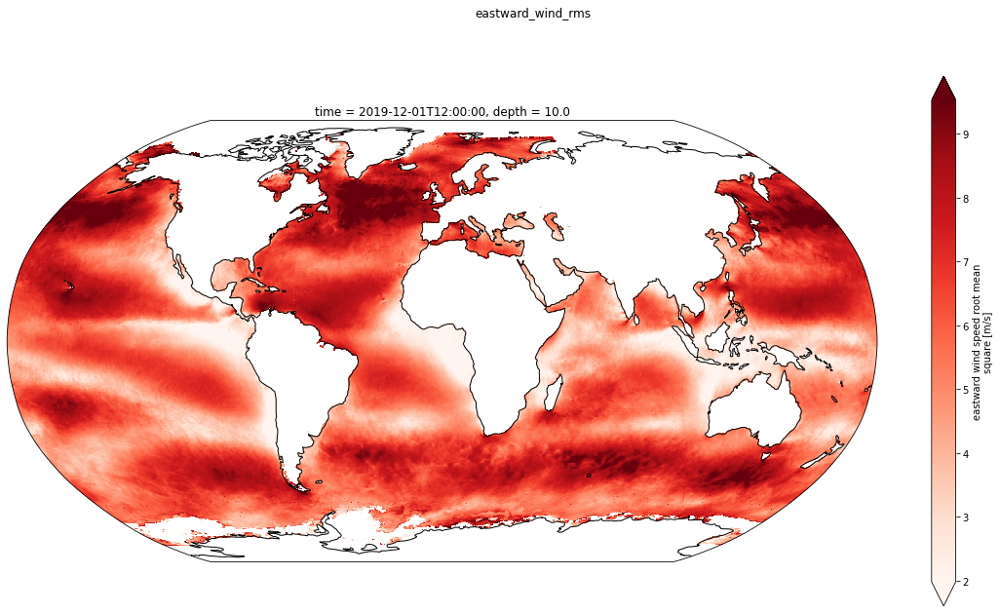

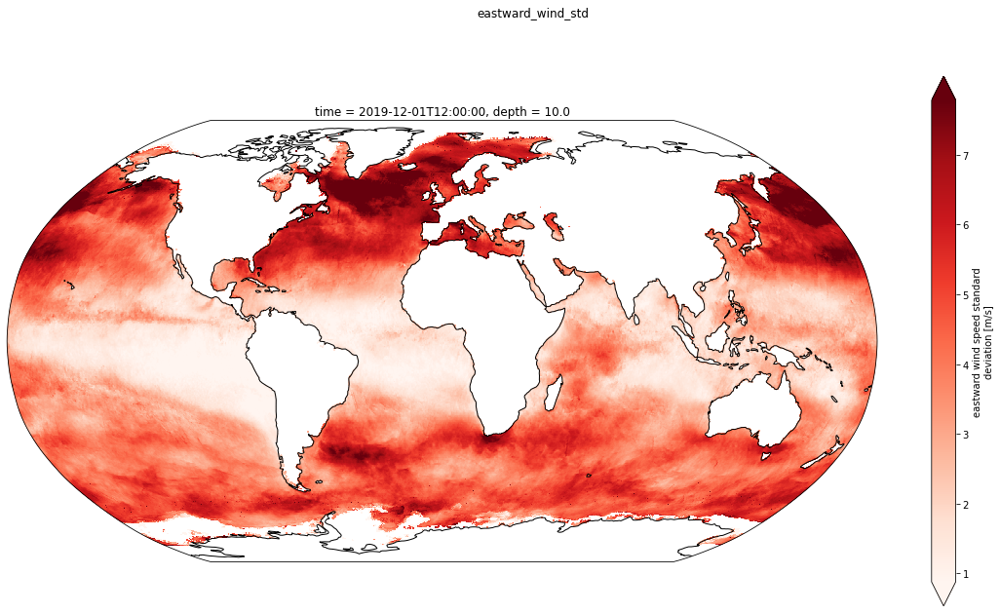

<IPython.core.display.Javascript object>

In [192]:
ls_eastward_wind = [wind.eastward_wind, wind.eastward_wind_rms, wind.eastward_wind_std]

for v in ls_eastward_wind:
    fig = plt.figure(figsize=(20, 10))
    fig.suptitle("{variable}".format(variable=v.name))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.coastlines()
    if v.name == "eastward_wind":
        p = v.isel(time=0).plot(
            transform=ccrs.PlateCarree(),
            robust=True,
            cmap="RdBu_r",
            vmin=-7.5,
            vmax=7.5,
        )  
    else:
        p = v.isel(time=0).plot(transform=ccrs.PlateCarree(), robust=True, cmap="Reds")

# Wind Stress
Wind stress is a force computed, from a part, with the difference of wind and ocean current. When wind and ocean current are not in the same direction the stress direction is more or less a combination of these both components.

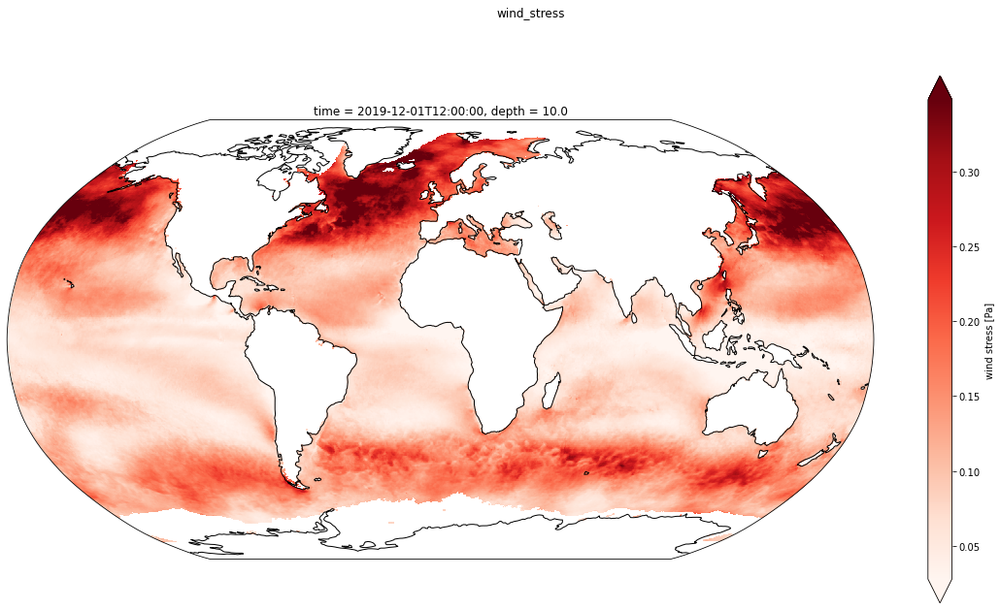

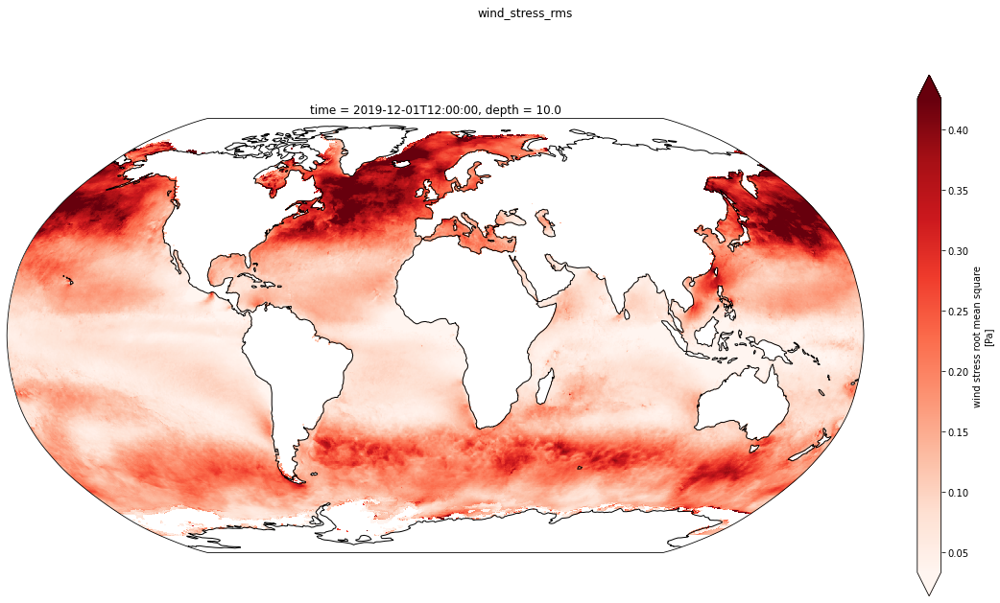

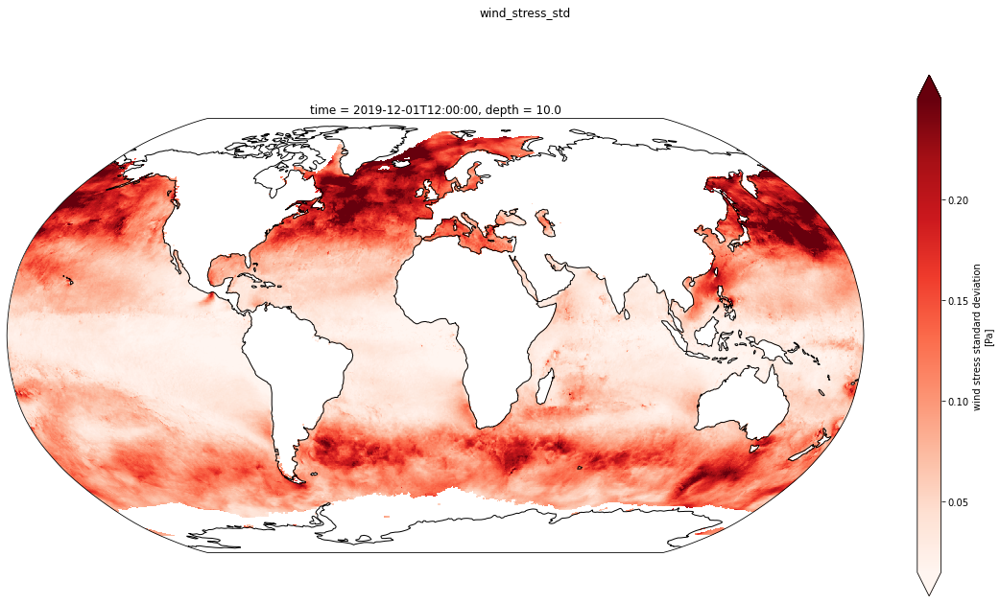

<IPython.core.display.Javascript object>

In [143]:
ls_wind_stress = [wind.wind_stress, wind.wind_stress_rms, wind.wind_stress_std]


for v in ls_wind_stress:
    fig = plt.figure(figsize=(20, 10))
    fig.suptitle("{variable}".format(variable=v.name))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.coastlines()
    p = v.isel(time=0).plot(
        transform=ccrs.PlateCarree(), robust=True, cmap="Reds"
    )  # , vmin=0.00, vmax=0.6

## Surface downward northward stress
Ocean surface stress (OSS) is the two-dimensional vector drag at the bottom of the atmosphere and the dynamical forcing at the top of the ocean. OSS influences the air-sea exchange of energy, water and gases. OSS is important for determining the large scale momentum forcing of the ocean, and consequent ocean circulation including ocean upwelling regions. Accurate knowledge of stress magnitudes is also essential for reliable computations of air-sea heat fluxes as well as air-sea gas exchanges and mass fluxes.

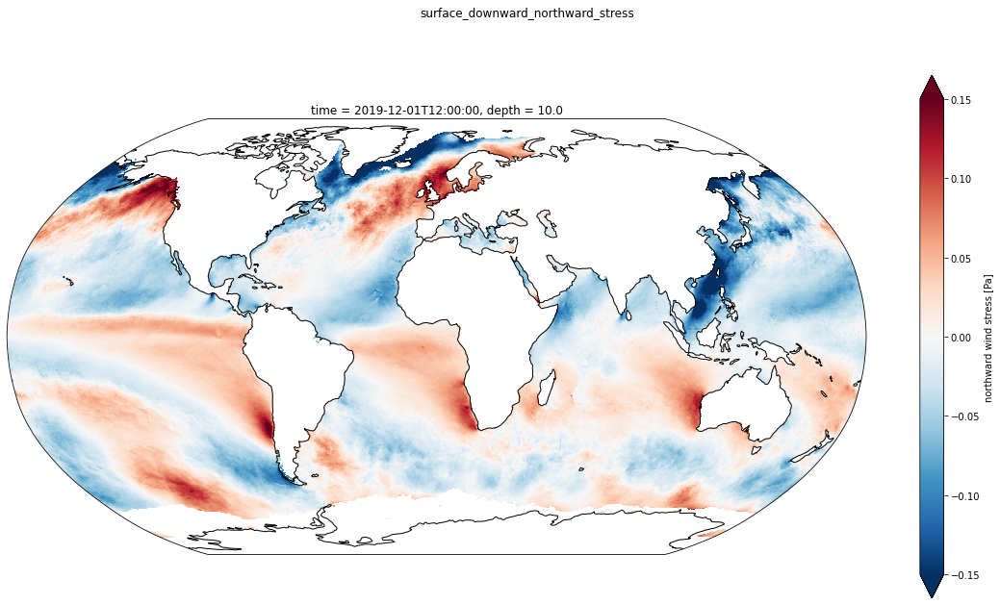

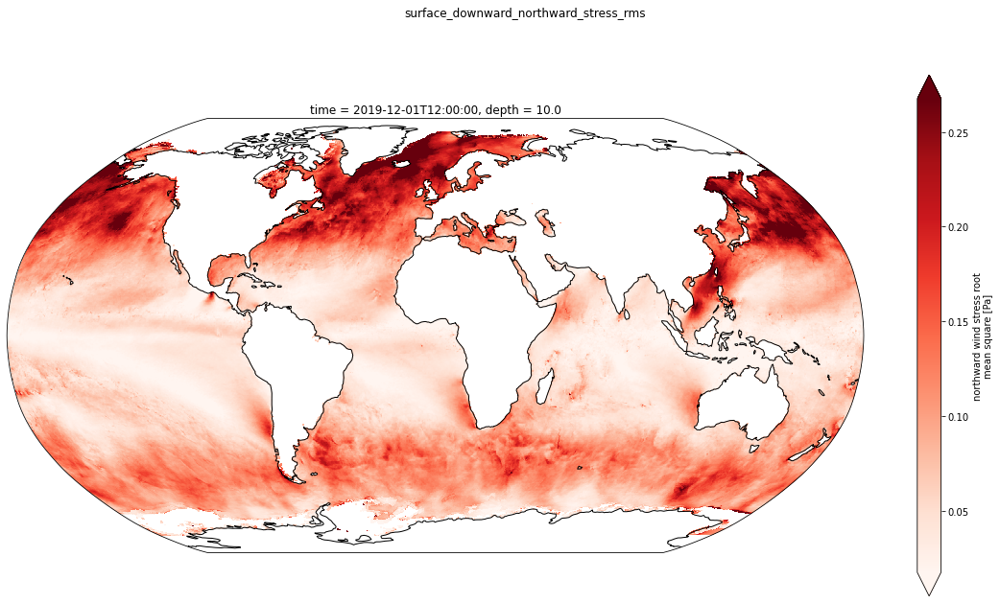

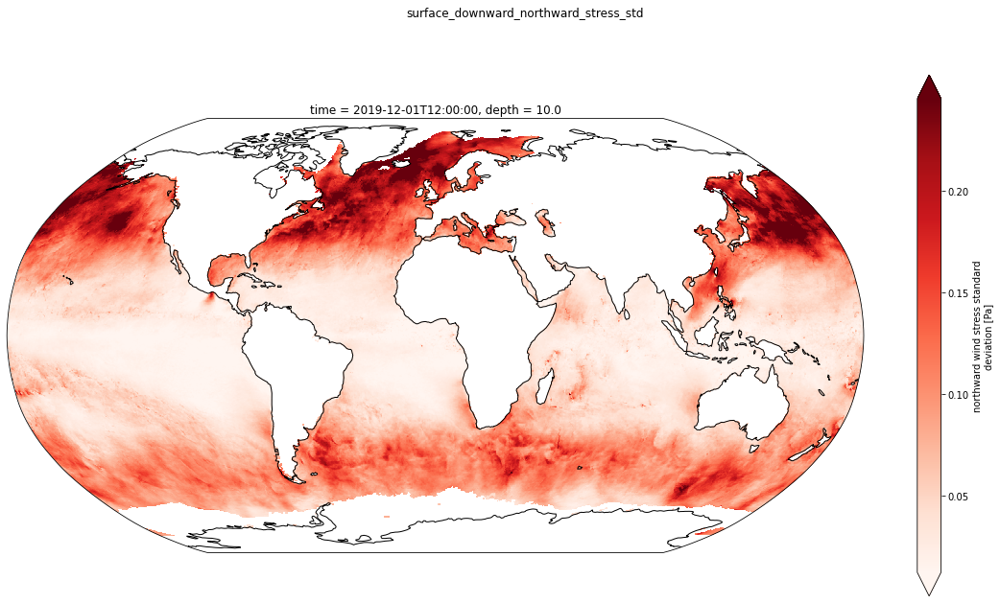

<IPython.core.display.Javascript object>

In [202]:
ls_surface_downward_northward_stress = [
    wind.surface_downward_northward_stress,
    wind.surface_downward_northward_stress_rms,
    wind.surface_downward_northward_stress_std,
]

for v in ls_surface_downward_northward_stress:
    fig = plt.figure(figsize=(20, 10))
    fig.suptitle('{variable}'.format(variable=v.name))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.coastlines()
    if v.name == 'surface_downward_northward_stress':
        p = v.isel(time=0).plot(transform=ccrs.PlateCarree(), robust=True, cmap = 'RdBu_r', vmin=-0.15, vmax=0.15)#vmax=1., vmin=0.)
    else:
        p = v.isel(time=0).plot(transform=ccrs.PlateCarree(), robust=True, cmap = 'Reds')



## Surface downward eastward stress

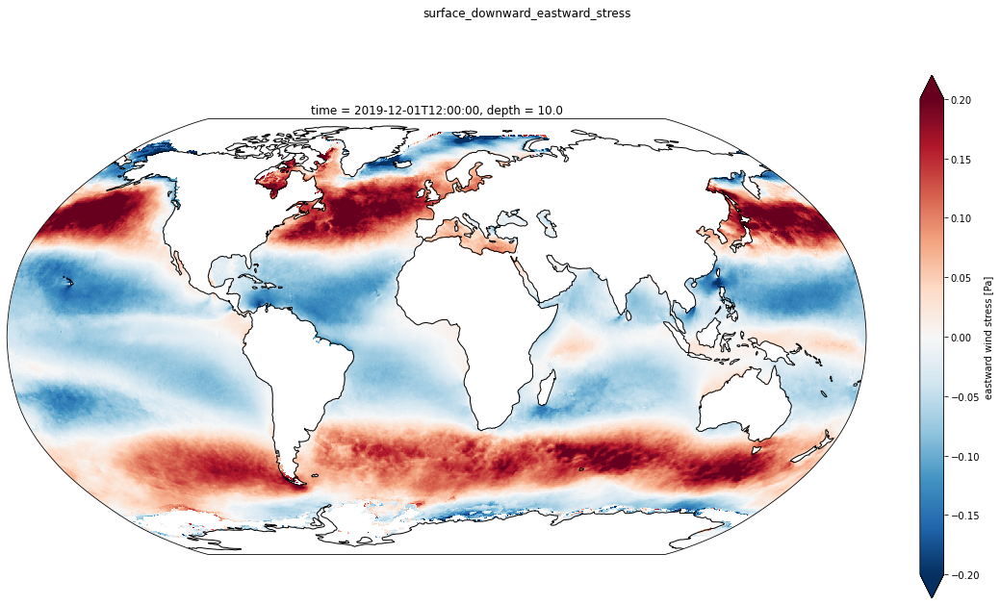

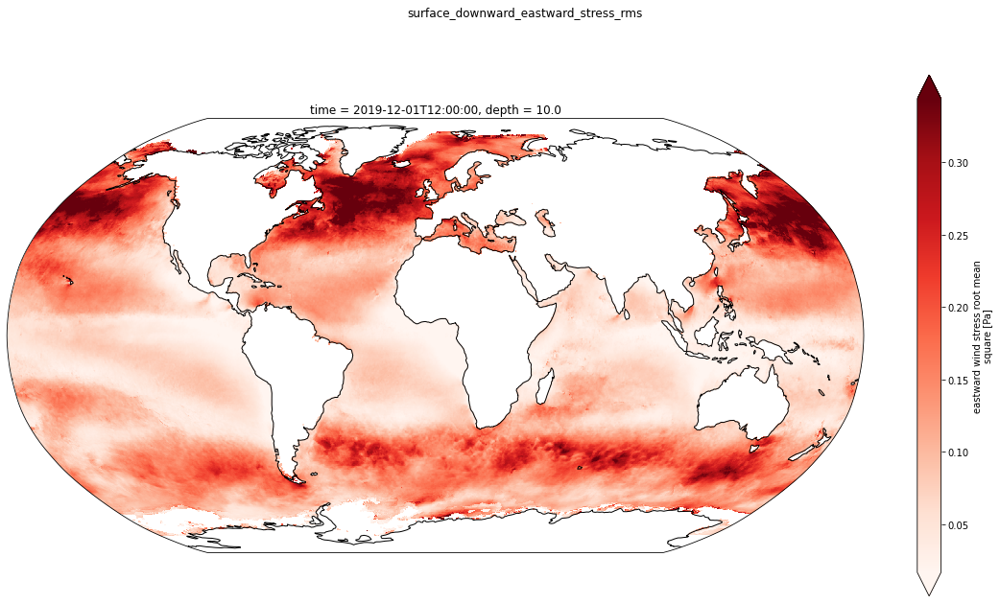

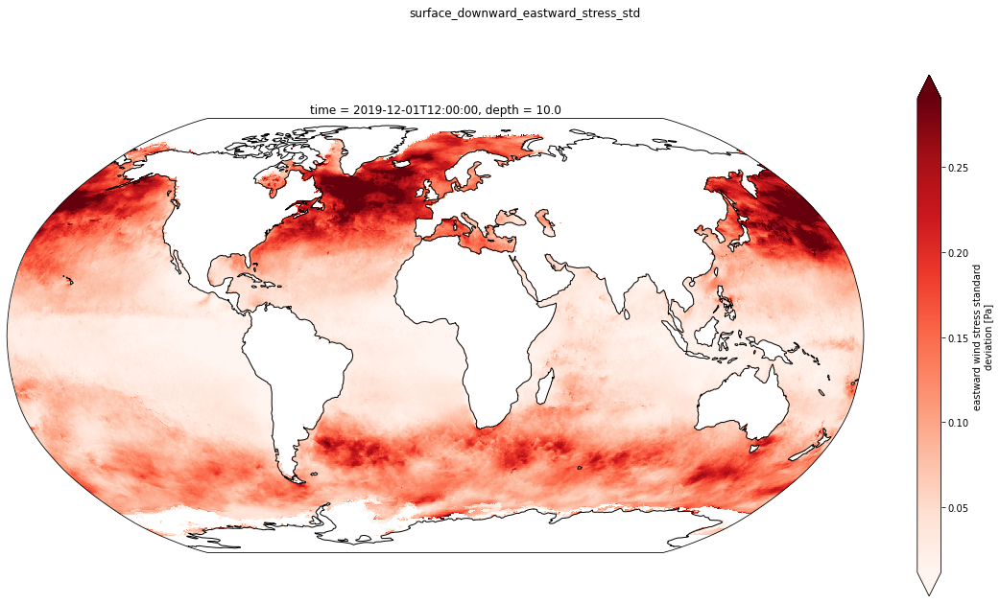

<IPython.core.display.Javascript object>

In [193]:
ls = [wind.surface_downward_eastward_stress,
      wind.surface_downward_eastward_stress_rms,
      wind.surface_downward_eastward_stress_std,
     ]
for v in ls:
    fig = plt.figure(figsize=(20, 10))
    fig.suptitle('{variable}'.format(variable=v.name))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.coastlines()
    if v.name == 'surface_downward_eastward_stress':
        p = v.isel(time=0).plot(transform=ccrs.PlateCarree(), robust=True, cmap = 'RdBu_r', vmin=-0.20, vmax=0.20)#vmax=1., vmin=0.)
    else:
        p = v.isel(time=0).plot(transform=ccrs.PlateCarree(), robust=True, cmap = 'Reds')
